# Atividade 3

In [6]:
import random
import math

import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from IPython.display import display
from numba import njit

In [7]:
@njit   # necessario para rodar com outras funcoes
def transform_255(img: np.ndarray) -> np.ndarray:
    fm = img - np.min(img)
    fs = 255 * (fm / np.amax(fm))
    return fs

In [8]:
def plot_histogram(im: np.ndarray, title=None) -> None:
    hist = np.zeros(256)
    for y in range(im.shape[0]):
        for x in range(im.shape[1]):
            value = im[y][x]
            hist[value] += 1
    plt.figure(figsize=(15, 6))
    plt.bar(np.arange(256), hist)
    if title:
        plt.title(title, fontsize=20)
    plt.show()

## Adicionar ruído

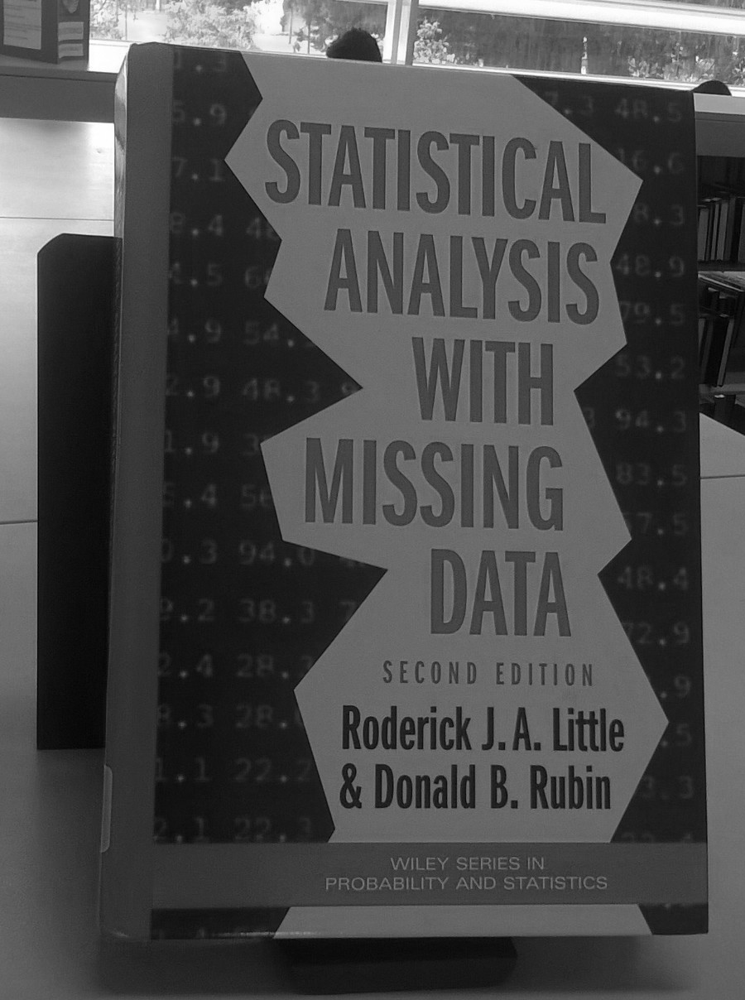

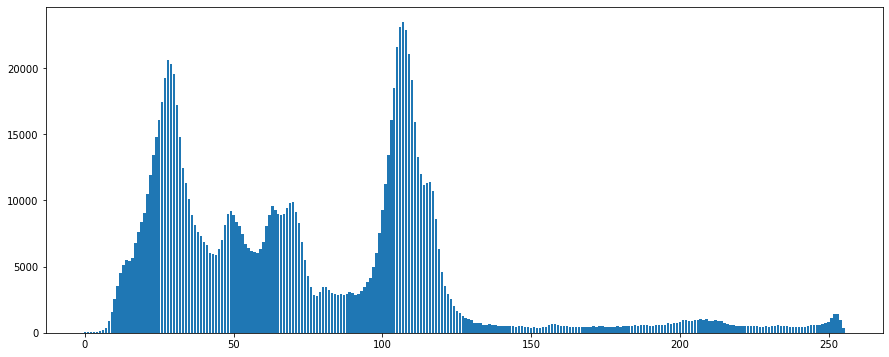

In [9]:
img = Image.open("data/restauracao/image_(1).jpg")
im_array = np.array(img)
display(img)
plot_histogram(im_array)

### Impulso Unipolar

- Para cada pixel, com uma probabilidade de 15% do evento ocorrer, substitua a intensidade do pixel pela intensidade de valor 0.

In [10]:
@njit
def impulse_unipolar(img: np.ndarray) -> np.ndarray:
    im_noise = np.empty(img.shape)
    for y in range(img.shape[0]):
        for x in range(img.shape[1]):
            rng = random.random()
            if rng <= 0.15:
                im_noise[y][x] *= 0
            else:
                im_noise[y][x] = img[y][x]
    return im_noise.astype(np.uint8)

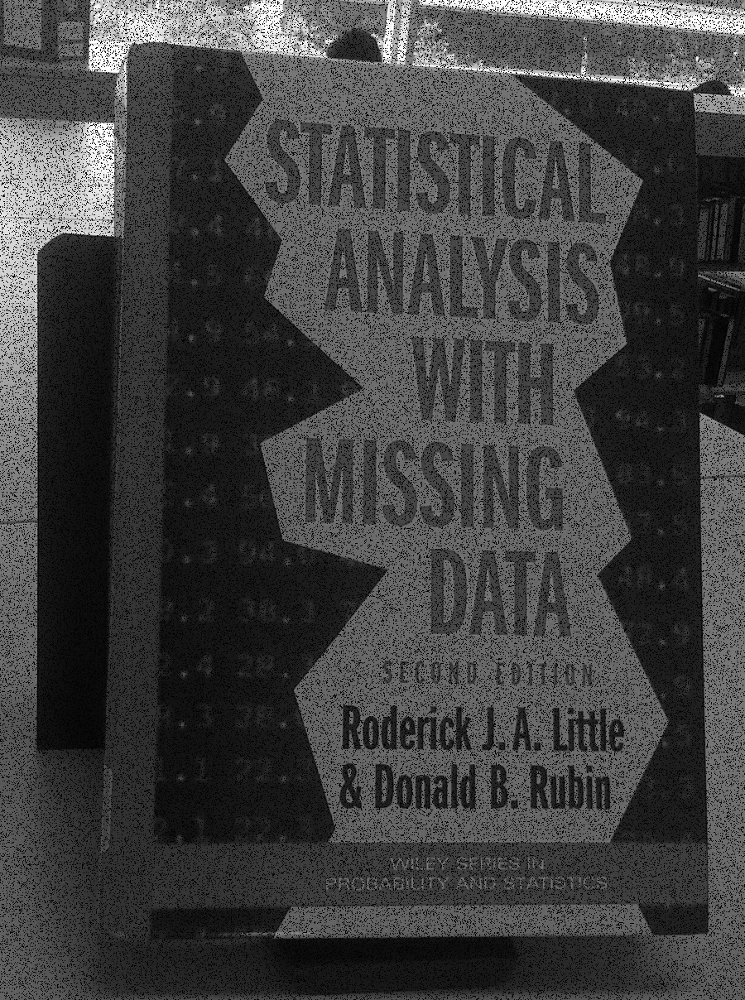

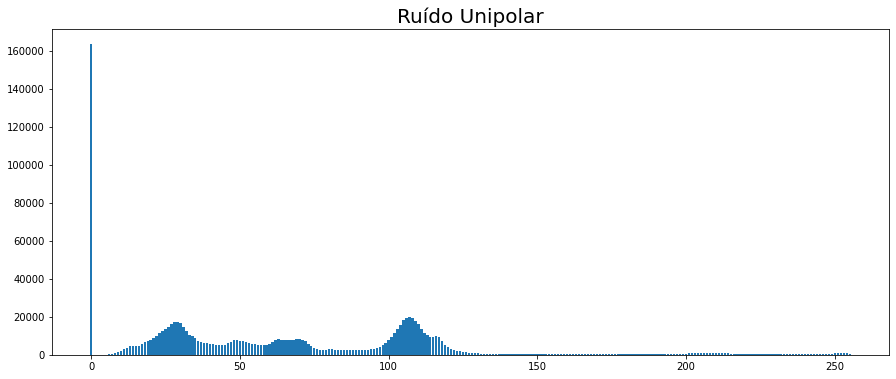

In [12]:
im_noise_unip = impulse_unipolar(im_array)
im_noise_unip_img = Image.fromarray(im_noise_unip)
im_noise_unip_img.save("data/restauracao/result/image_imp_unip(1).jpg")
display(im_noise_unip_img)
plot_histogram(im_noise_unip, "Ruído Unipolar")

### Impulso Bipolar (Sal e Pimenta)

- Para cada pixel, com uma probabilidade de 10% de cada evento ocorrer, substitua a intensidade do pixel pela intensidade de valor 0 ou 255.

In [13]:
@njit
def impulse_bipolar(img: np.ndarray) -> np.ndarray:
    im_noise = np.empty(img.shape)
    for y in range(img.shape[0]):
        for x in range(img.shape[1]):
            rng = random.random()
            if rng <= 0.10:
                rng = random.random()
                if rng >= 0.5:
                    im_noise[y][x] = np.array([255,255,255])
                else:
                    im_noise[y][x] *= 0
            else:
                im_noise[y][x] = img[y][x]
    return im_noise.astype(np.uint8)

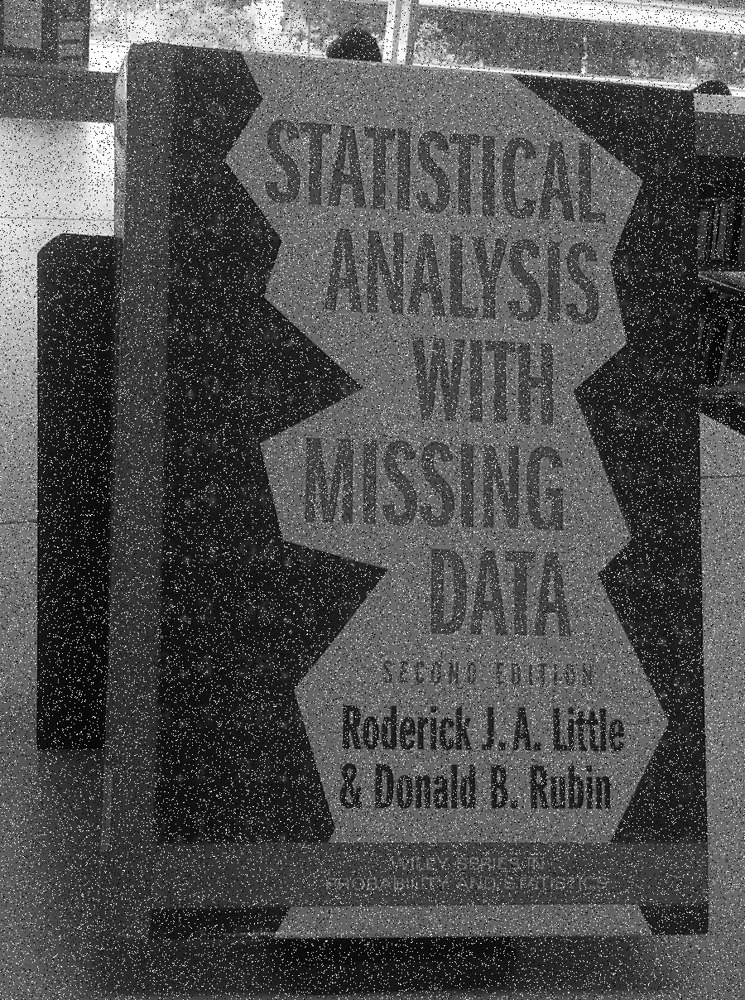

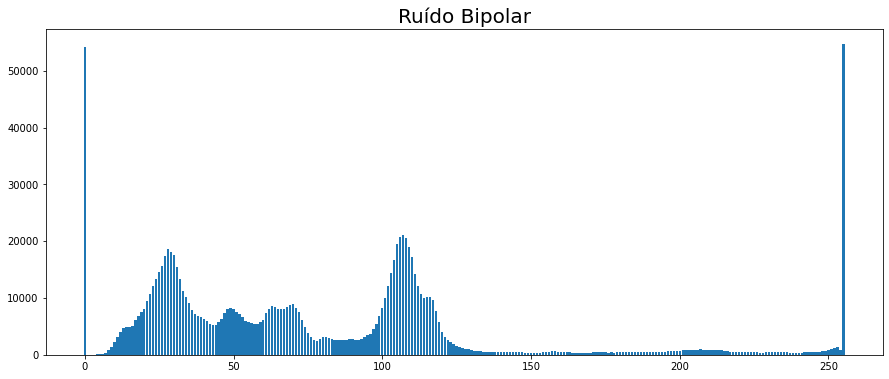

In [14]:
im_noise_bip = impulse_bipolar(im_array)
im_noise_bip_img = Image.fromarray(im_noise_bip)
im_noise_bip_img.save("data/restauracao/result/image_imp_bip(1).jpg")
display(im_noise_bip_img)
plot_histogram(im_noise_bip, "Ruído Bipolar")

### Gaussiano

- Para cada pixel, adicione um valor extraído aleatoriamente de uma gaussiana com média 10 e desvio-padrão 30.

In [15]:
@njit
def gaussian(img: np.ndarray) -> np.ndarray:
    im_noise = np.empty(img.shape)
    for y in range(img.shape[0]):
        for x in range(img.shape[1]):
            # legado por causa do numba
            rng = np.random.normal(10, 30)
            im_noise[y][x] = img[y][x] + rng
    im_noise = transform_255(im_noise)
    return im_noise.astype(np.uint8)

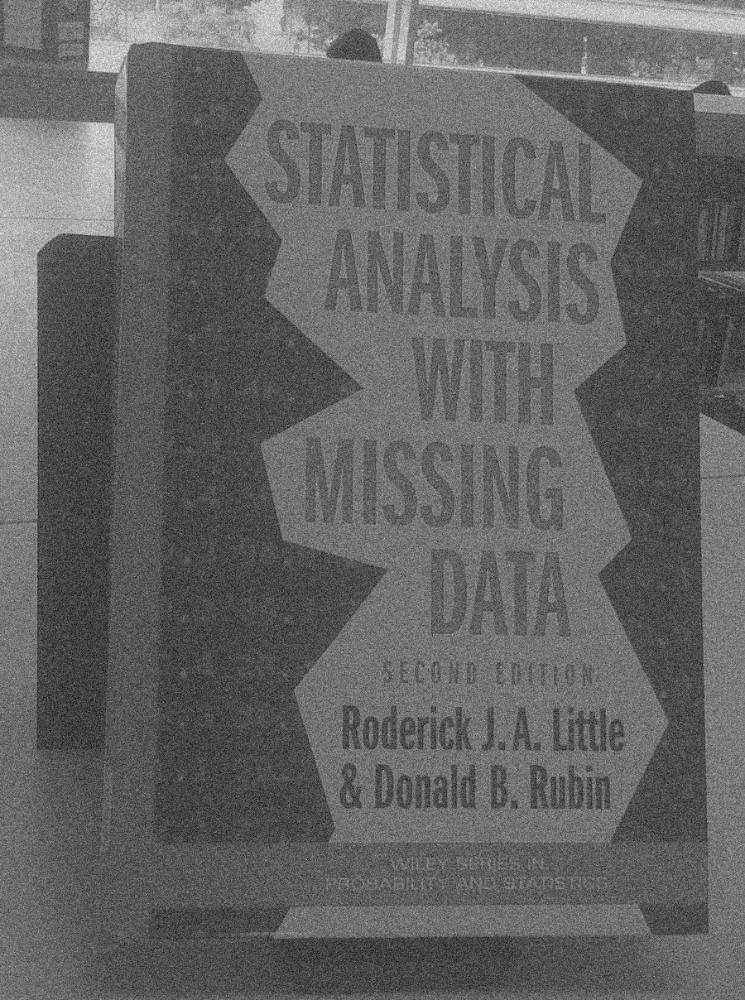

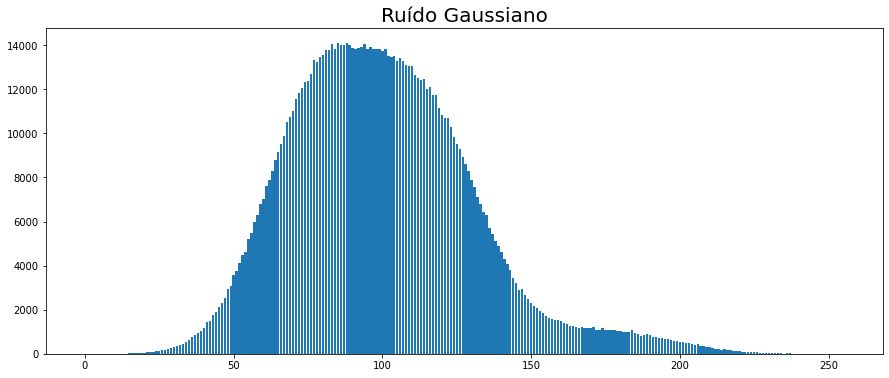

In [16]:
im_noise_gaus = gaussian(im_array)
im_noise_gaus_img = Image.fromarray(im_noise_gaus)
im_noise_gaus_img.save("data/restauracao/result/image_imp_gaus(1).jpg")
display(im_noise_gaus_img)
plot_histogram(im_noise_gaus, "Ruído Gaussiano")

## Restauração

In [17]:
# WRONG
def gaussian(img_tr: np.ndarray, band: int, w: int, t="br") -> np.ndarray:
    im_tr_filter = np.empty(img_tr.shape)
    for v in range(img_tr.shape[0]):
        # print(v)
        for u in range(img_tr.shape[1]):
            # print(u)
            d = math.sqrt(math.pow(v, 2) + math.pow(u, 2))
            if d == 0:
                print("zero")
            # print(d)
            im_tr_filter[v][u] = 1 - math.pow(math.e,  math.pow((
                (math.pow(d, 2) - math.pow(band, 2) / (d*w))
            ), 2))
    if t == "bp":
        im_tr_filter = 1 - im_tr_filter
    return im_tr_filter

In [18]:
# WRONG
@njit
def butterworth(img_tr: np.ndarray, band: int, n: int, w: int, t="br") -> np.ndarray:
    im_tr_filter = np.empty(img_tr.shape)
    center = (
        math.floor(img_tr.shape[0]/2),
        math.floor(img_tr.shape[1]/2)
    )
    for y in range(img_tr.shape[0]):
        v = y - center[0]
        # print(v)
        for x in range(img_tr.shape[1]):
            u = x - center[1]
            # print(u)
            d = abs(u) + abs(v)
            # print(d)
            im_tr_filter[x][y] = 1 / math.pow(
                (1 + ((d * w) / (math.pow(d, 2) - math.pow(band, 2)))), 2*n
            )
    if t == "bp":
        im_tr_filter = 1 - im_tr_filter
    return im_tr_filter


In [19]:
# WRONG
@njit
def contra_harmonic_mean(img: np.ndarray, kernel_size: tuple[int, int], q: int) -> np.ndarray:
    im_restore = np.empty(img.shape)
    h, w = img.shape[:2]
    ky = math.floor(kernel_size[0]/2)
    kx = math.floor(kernel_size[1]/2)
    # k_area = kernel_size[0] * kernel_size[1]
    for y in range(h):
        for x in range(w):
            tmp1 = 0
            tmp2 = 0
            for i in range(-ky, ky + 1):
                vy = y + i
                for j in range(-kx, kx + 1):
                    vx = x + j
                    tmp1 += math.pow(img[vy][vx]+1 if 0 <= vy < h and 0 <= vx < w else 1, q+1)
                    tmp2 += math.pow(img[vy][vx]+1 if 0 <= vy < h and 0 <= vx < w else 1, q)
            im_restore[y][x] = tmp1 / tmp2
    im_restore = transform_255(im_restore)
    return im_restore.astype(np.uint8)

In [20]:
@njit
def arith_mean(img: np.ndarray, kernel_size: tuple[int, int]) -> np.ndarray:
    im_restored = np.empty(img.shape)
    area = kernel_size[0] * kernel_size[1]
    h, w = img.shape[:2]
    wy =  math.floor(kernel_size[0] / 2)
    wx = math.floor(kernel_size[1] / 2)
    for y in range(h):
        for x in range(w):
            tmp = 0
            for i in range(-wy, wy + 1):
                vy = y + i
                for j in range(-wx, wx + 1):
                    vx = x + j
                    tmp += img[vy][vx] if 0 <= vy < h and 0 <= vx < w else 0
            im_restored[y][x] = (1/area) * tmp
    im_restored = transform_255(im_restored)
    return im_restored.astype(np.uint8)

In [21]:
def median(img: np.ndarray, kernel_size: tuple[int,int]) -> np.ndarray:
    im_restored = np.empty(img.shape)
    h, w = img.shape[:2]
    wy = math.floor(kernel_size[0]/2)
    wx = math.floor(kernel_size[1]/2)
    for y in range(h):
        for x in range(w):
            tmp = []
            for i in range(-wy, wy + 1):
                vy = y + i
                for j in range(-wx, wx + 1):
                    vx = x + j
                    tmp.append(img[vy][vx] if 0 <= vy < h and 0 <= vx < w else 0) 
            im_restored[y][x] = np.median(tmp)
    im_restored = transform_255(im_restored)
    return im_restored.astype(np.uint8)

In [22]:
@njit
def max_filter(img: np.ndarray, kernel_size: tuple[int, int]) -> np.ndarray:
    im_restored = np.empty(img.shape)
    h, w = img.shape[:2]
    wy = math.floor(kernel_size[0]/2)
    wx = math.floor(kernel_size[1]/2)
    for y in range(h):
        for x in range(w):
            tmp = 0
            for i in range(-wy, wy + 1):
                vy = y + i
                for j in range(-wx, wx + 1):
                    vx = x + j
                    if 0 <= vy < h and 0 <= vx < w:
                        if img[vy][vx] > tmp:
                            tmp = img[vy][vx]
            im_restored[y][x] = tmp
    return im_restored.astype(np.uint8)

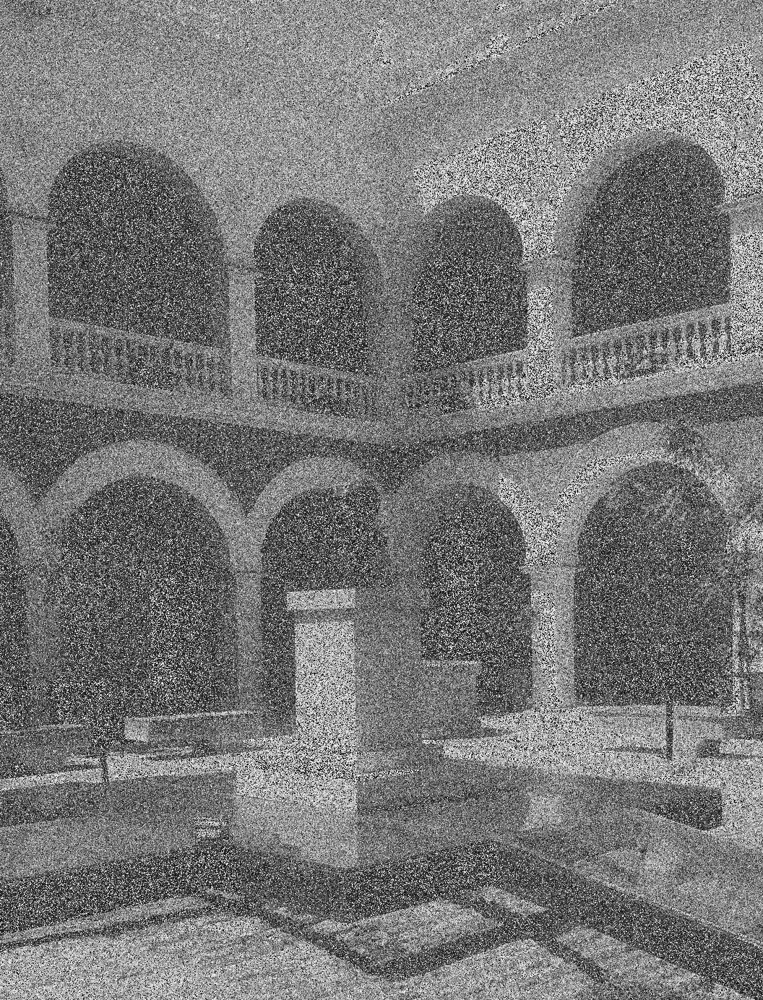

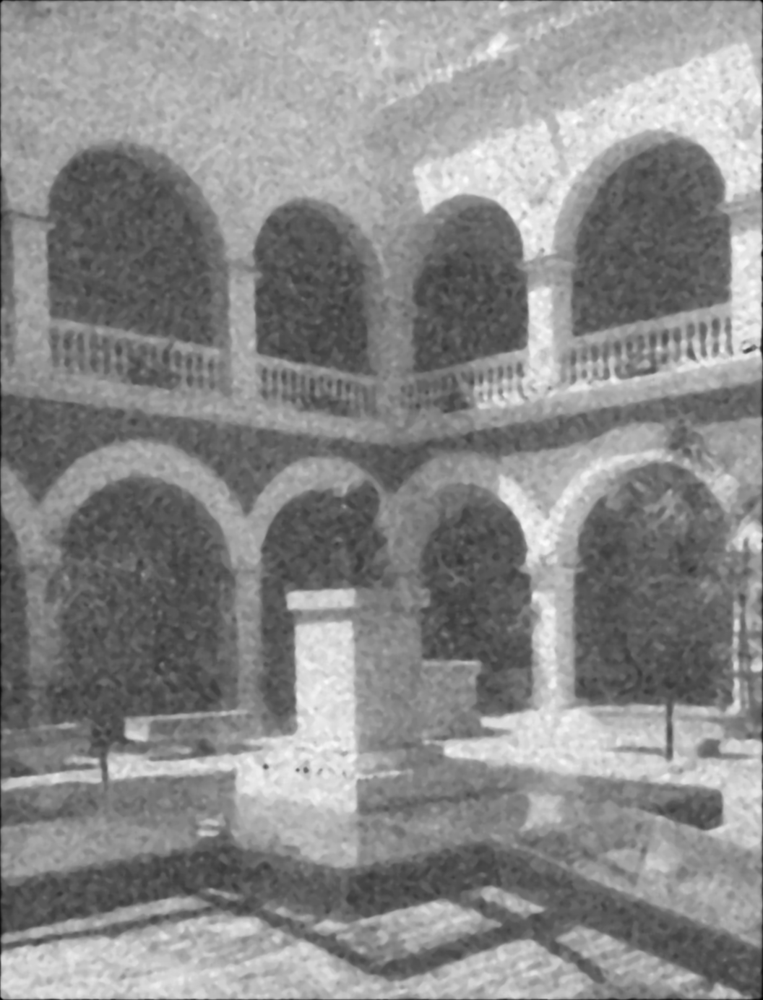

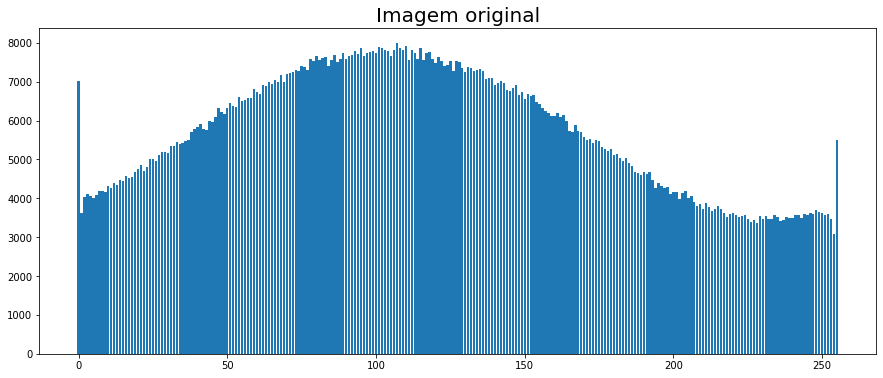

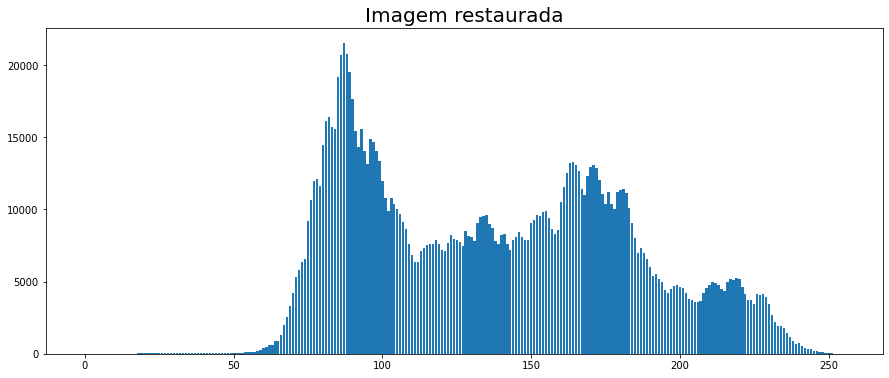

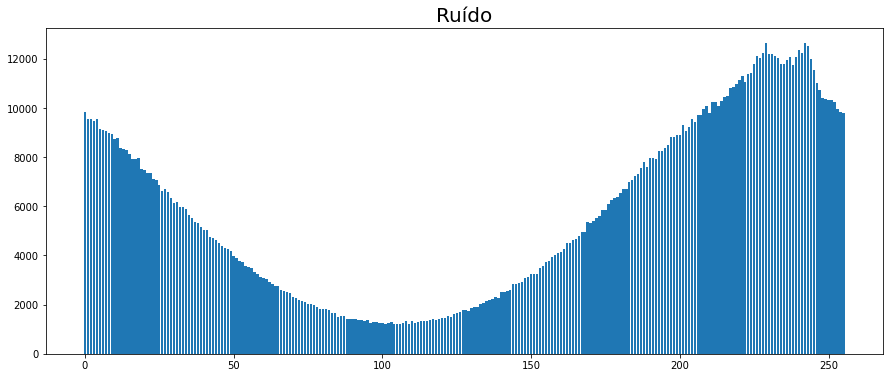

In [23]:
img_2 = Image.open("data/restauracao/image_(2).jpg")
im_array_2 = np.array(img_2)
display(img_2)

# im_restore_2 = max_filter(im_array_2, (5,5))
im_restore_2 = median(im_array_2, (7,7))
im_restore_2 = median(im_restore_2, (7,7))
im_restore_2 = arith_mean(im_restore_2, (3,3))
im_restore_2_img = Image.fromarray(im_restore_2)
im_restore_2_img.save("data/restauracao/result/image_mean_median(2).jpg")
display(im_restore_2_img)
plot_histogram(im_array_2, "Imagem original")
plot_histogram(im_restore_2, "Imagem restaurada")
plot_histogram(im_array_2 - im_restore_2, "Ruído")

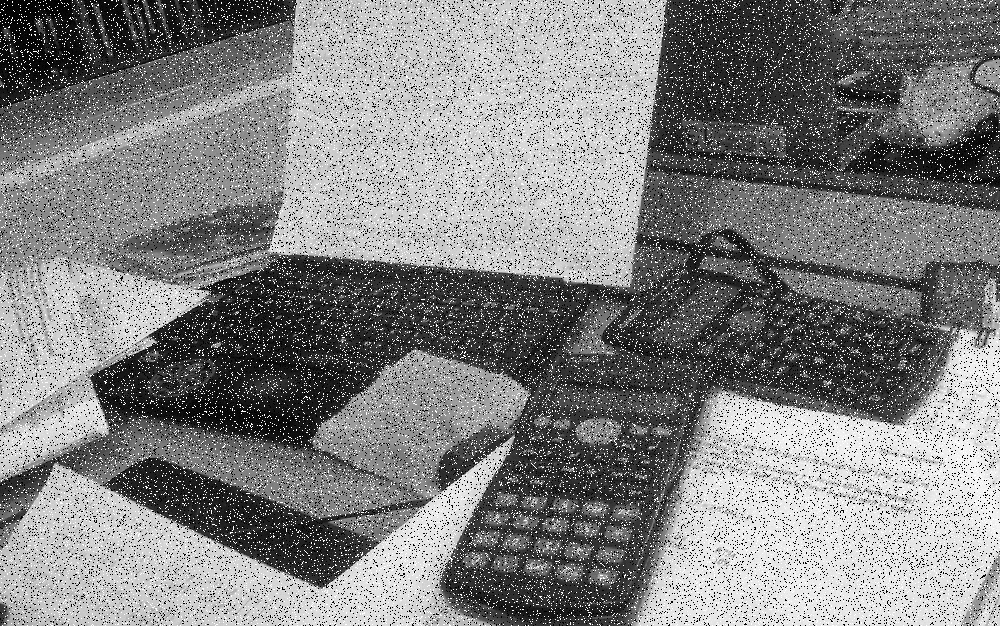

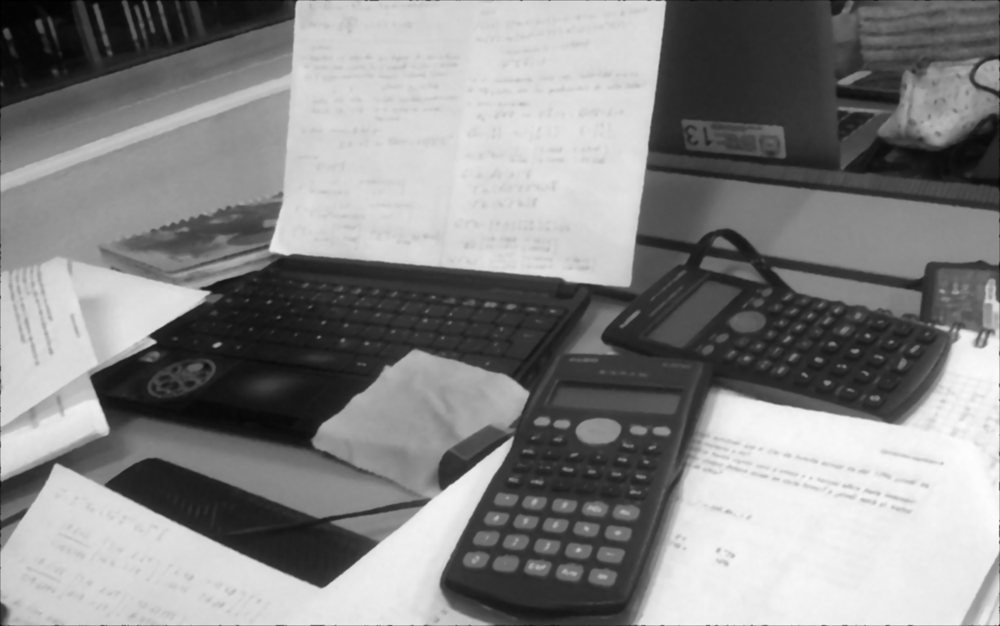

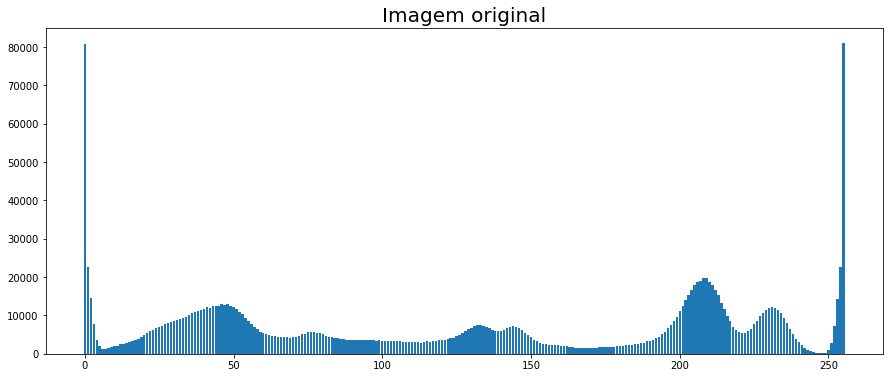

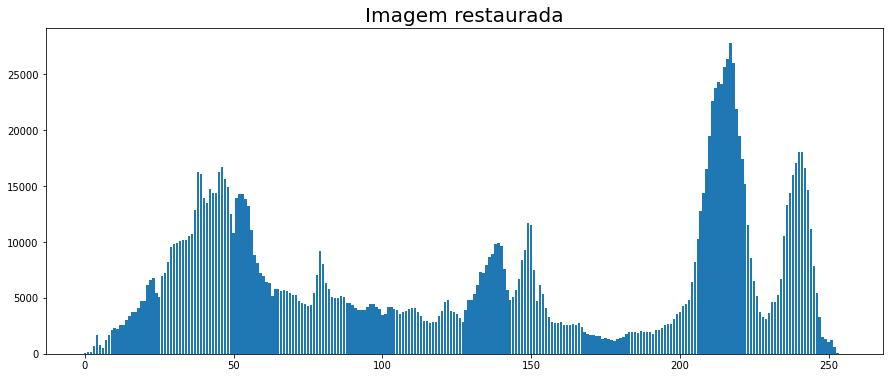

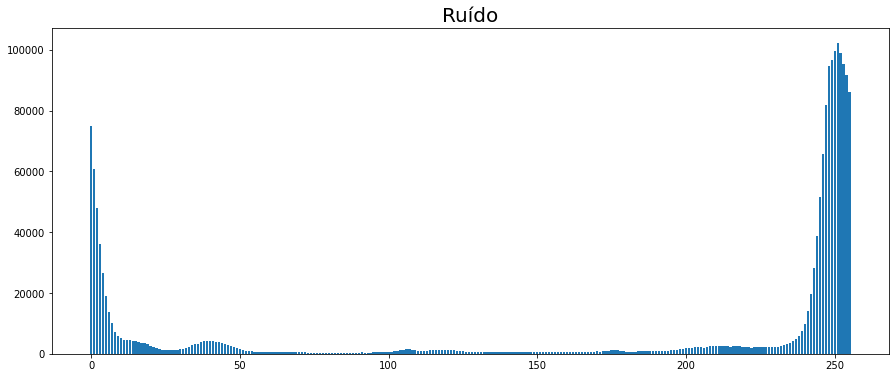

In [24]:
img_3 = Image.open("data/restauracao/image_(3).jpg")
im_array_3 = np.array(img_3)
display(img_3)

im_restore_3 = median(im_array_3, (7,7))
im_restore_3 = arith_mean(im_restore_3, (3,3))
im_restore_3_img = Image.fromarray(im_restore_3)
im_restore_3_img.save("data/restauracao/result/image_mean_median(3).jpg")
display(im_restore_3_img)
plot_histogram(im_array_3, "Imagem original")
plot_histogram(im_restore_3, "Imagem restaurada")
plot_histogram(im_array_3 - im_restore_3, "Ruído")

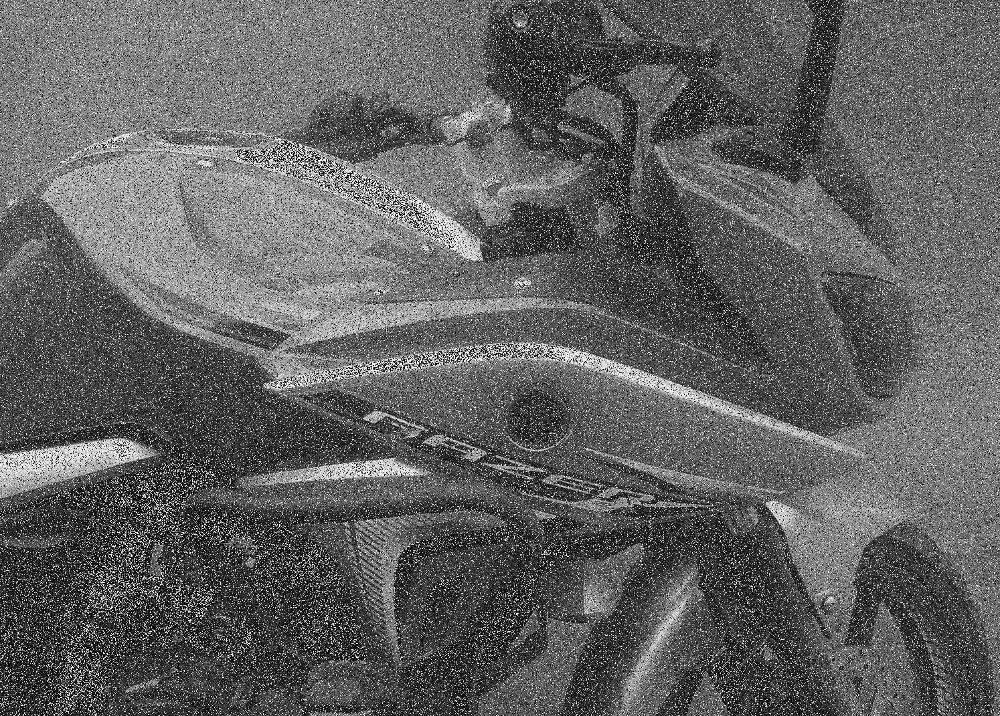

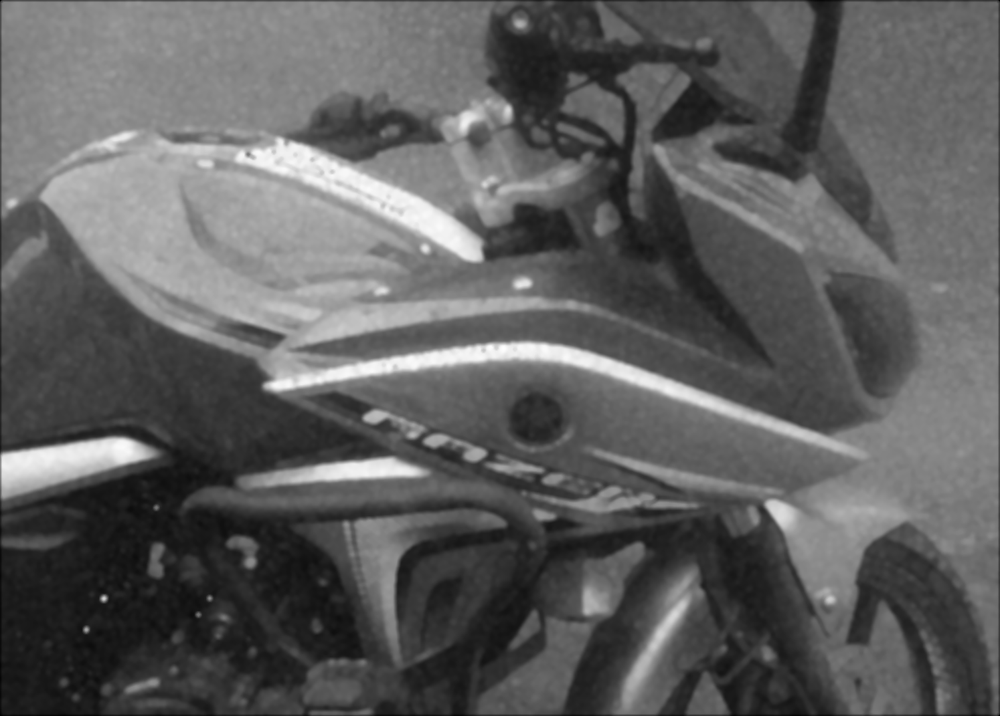

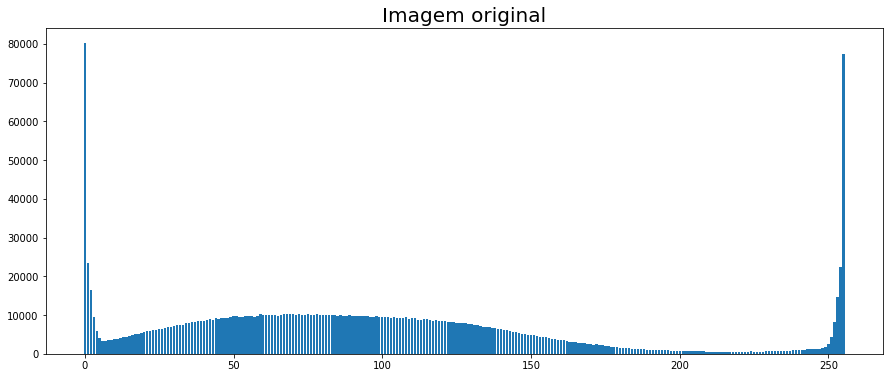

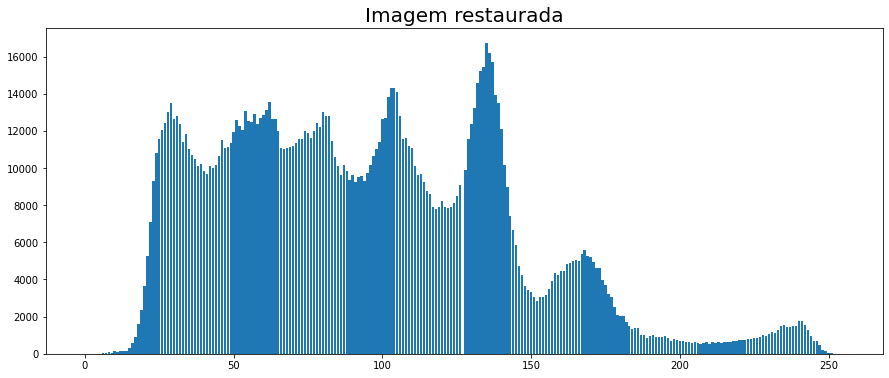

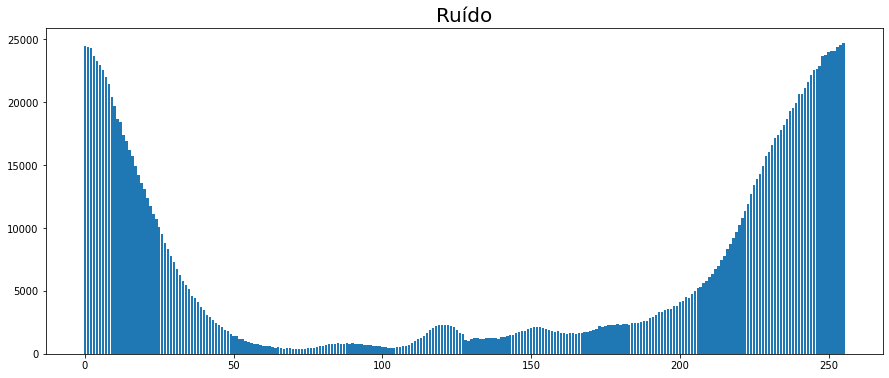

In [25]:
img_4 = Image.open("data/restauracao/image_(4).jpg")
im_array_4 = np.array(img_4)
display(img_4)

im_restore_4 = median(im_array_4, (7,7))
im_restore_4 = max_filter(im_restore_4, (5,5))
im_restore_4 = arith_mean(im_restore_4, (7,7))
# im_restore_4 = median(im_array_4, (7,7))
im_restore_4 = median(im_restore_4, (5,5))
im_restore_4_img = Image.fromarray(im_restore_4)
im_restore_4_img.save("data/restauracao/result/image_mean_median(4).jpg")
display(im_restore_4_img)
plot_histogram(im_array_4, "Imagem original")
plot_histogram(im_restore_4, "Imagem restaurada")
plot_histogram(im_array_4 - im_restore_4, "Ruído")